# 🎵 Spotify Hit Prediction (2011–2019)  

This project explores the **Spotify Tracks Dataset (2011–2019)** to predict whether a track will become a **hit (Billboard Hot-100)** or a **flop**.  
The dataset contains detailed **audio features** extracted from Spotify’s API, along with metadata about each track.  

---

## 📂 Dataset Overview  

Each row in the dataset represents a track, with the following features:

- **track** 🎶: Name of the track  
- **artist** 🎤: Name of the artist  
- **uri** 🔗: Spotify resource identifier for the track  

### 🎼 Audio Features  
- **danceability** 💃: Suitability for dancing (0.0 = least, 1.0 = most)  
- **energy** ⚡: Perceptual measure of intensity & activity (0.0–1.0)  
- **key** 🎹: Estimated musical key (0 = C, 1 = C#/Db, 2 = D, …, -1 = undetected)  
- **loudness** 🔊: Overall loudness in decibels (-60 dB to 0 dB)  
- **mode** 🎼: Musical modality (1 = Major, 0 = Minor)  
- **speechiness** 🗣️: Presence of spoken words (0.0–1.0)  
- **acousticness** 🎻: Confidence measure whether the track is acoustic (0.0–1.0)  
- **instrumentalness** 🎺: Likelihood of no vocals (0.0–1.0, closer to 1 = instrumental)  
- **liveness** 🎤: Presence of audience/live performance probability (0.0–1.0)  
- **valence** 🙂☹️: Musical positiveness (0.0 = sad/angry, 1.0 = happy/cheerful)  
- **tempo** ⏱️: Estimated tempo in beats per minute (BPM)  
- **duration_ms** ⏳: Track duration in milliseconds  
- **time_signature** 🥁: Estimated time signature (beats per bar)  

### 🔍 Structural Features  
- **chorus_hit** 🎶: Estimated timestamp (ms) when the chorus starts  
- **sections** 🎼: Number of sections in the track  

### 🎯 Target Variable  
- **target**: Binary outcome for hit prediction  
  - `1` → The track appeared in Billboard Hot-100 (Hit)  
  - `0` → The track did not appear (Flop)  

---

## 🥅 Problem Statement  

Build a machine learning model to predict **whether a track becomes a hit or not** based on its audio and structural features.  
This involves:  
- Data cleaning & validation  
- Feature engineering  
- Handling class imbalance (Hit vs Flop)  
- Model training, hyperparameter tuning & evaluation  

---

## ⚡ Motivation  

Understanding what makes a song a "hit" is valuable for:  
- 🎶 **Music Producers & Artists**: to create tracks with higher chances of success  
- 📊 **Music Analysts & Researchers**: to study evolving trends in music  
- 💼 **Streaming Platforms & Record Labels**: to forecast popularity and improve recommendations  

---


In [69]:
# Importing the required tools 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#ignoring warnings
import warnings
warnings.filterwarnings("ignore")

# Preprocessing tools
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler,OneHotEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import FunctionTransformer

from imblearn.combine import SMOTETomek


# model algorithms
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.naive_bayes import BernoulliNB,MultinomialNB,GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier,GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.neural_network import MLPClassifier

#Hyperparameter tunning
from sklearn.model_selection import RandomizedSearchCV,GridSearchCV,cross_val_score,StratifiedKFold

# Model Evaluation
from sklearn.metrics import (accuracy_score,precision_score,
                             recall_score,confusion_matrix,
                             classification_report,
                             RocCurveDisplay,f1_score,roc_auc_score,
                             ConfusionMatrixDisplay,PrecisionRecallDisplay)

In [70]:
#loadin the data
df=pd.read_csv("data/spotify.csv")
df.head()

,track,artist,uri,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target
0,Lucky Man,Montgomery Gentry,spotify:track:4GiXBCUF7H6YfNQsnBRIzl,0.578,0.471,4,-7.270,1,0.0289,0.368000,0.00000,0.159,0.532,133.061,196707,4,30.88059,13,1
1,On The Hotline,Pretty Ricky,spotify:track:1zyqZONW985Cs4osz9wlsu,0.704,0.854,10,-5.477,0,0.1830,0.018500,0.00000,0.148,0.688,92.988,242587,4,41.51106,10,1
2,Clouds Of Dementia,Candlemass,spotify:track:6cHZf7RbxXCKwEkgAZT4mY,0.162,0.836,9,-3.009,1,0.0473,0.000111,0.00457,0.174,0.300,86.964,338893,4,65.32887,13,0
3,"Heavy Metal, Raise Hell!",Zwartketterij,spotify:track:2IjBPp2vMeX7LggzRN3iSX,0.188,0.994,4,-3.745,1,0.1660,0.000007,0.07840,0.192,0.333,148.440,255667,4,58.59528,9,0
4,I Got A Feelin',Billy Currington,spotify:track:1tF370eYXUcWwkIvaq3IGz,0.630,0.764,2,-4.353,1,0.0275,0.363000,0.00000,0.125,0.631,112.098,193760,4,22.62384,10,1


In [71]:
#columns in the dataset
print(df.columns)

Index(['track', 'artist', 'uri', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'duration_ms', 'time_signature', 'chorus_hit',
       'sections', 'target'],
      dtype='object')


In [72]:
#Getting the information about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41106 entries, 0 to 41105
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track             41106 non-null  object 
 1   artist            41106 non-null  object 
 2   uri               41106 non-null  object 
 3   danceability      41106 non-null  float64
 4   energy            41106 non-null  float64
 5   key               41106 non-null  int64  
 6   loudness          41106 non-null  float64
 7   mode              41106 non-null  int64  
 8   speechiness       41106 non-null  float64
 9   acousticness      41106 non-null  float64
 10  instrumentalness  41106 non-null  float64
 11  liveness          41106 non-null  float64
 12  valence           41106 non-null  float64
 13  tempo             41106 non-null  float64
 14  duration_ms       41106 non-null  int64  
 15  time_signature    41106 non-null  int64  
 16  chorus_hit        41106 non-null  float6

In [73]:
df.describe()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target
count,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,4.110600e+04,41106.000000,41106.000000,41106.000000,41106.000000
mean,0.539695,0.579545,5.213594,-10.221525,0.693354,0.072960,0.364197,0.154416,0.201535,0.542440,119.338249,2.348776e+05,3.893689,40.106041,10.475673,0.500000
std,0.177821,0.252628,3.534977,5.311626,0.461107,0.086112,0.338913,0.303530,0.172959,0.267329,29.098845,1.189674e+05,0.423073,19.005515,4.871850,0.500006
min,0.000000,0.000251,0.000000,-49.253000,0.000000,0.000000,0.000000,0.000000,0.013000,0.000000,0.000000,1.516800e+04,0.000000,0.000000,0.000000,0.000000
25%,0.420000,0.396000,2.000000,-12.816000,0.000000,0.033700,0.039400,0.000000,0.094000,0.330000,97.397000,1.729278e+05,4.000000,27.599792,8.000000,0.000000
50%,0.552000,0.601000,5.000000,-9.257000,1.000000,0.043400,0.258000,0.000120,0.132000,0.558000,117.565000,2.179070e+05,4.000000,35.850795,10.000000,0.500000
75%,0.669000,0.787000,8.000000,-6.374250,1.000000,0.069800,0.676000,0.061250,0.261000,0.768000,136.494000,2.667730e+05,4.000000,47.625615,12.000000,1.000000
max,0.988000,1.000000,11.000000,3.744000,1.000000,0.960000,0.996000,1.000000,0.999000,0.996000,241.423000,4.170227e+06,5.000000,433.182000,169.000000,1.000000


In [74]:
#Checking for null values
df.isna().sum()

track               0
artist              0
uri                 0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
duration_ms         0
time_signature      0
chorus_hit          0
sections            0
target              0
dtype: int64

## Exploratory Data Analysis

## Univariate Analysis

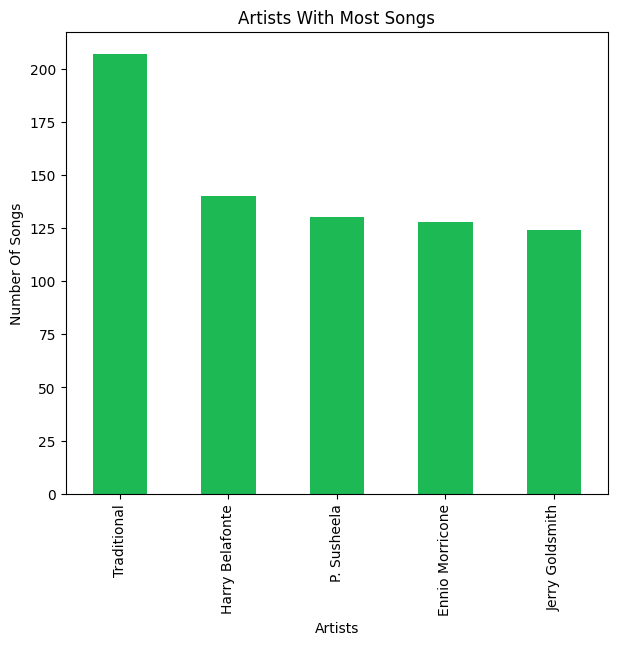

In [75]:
plt.figure(figsize=(7,6))
df["artist"].value_counts()[:5].plot(kind='bar',color="#1DB954")
plt.title("Artists With Most Songs")
plt.xlabel("Artists")
plt.ylabel("Number Of Songs")
plt.show()

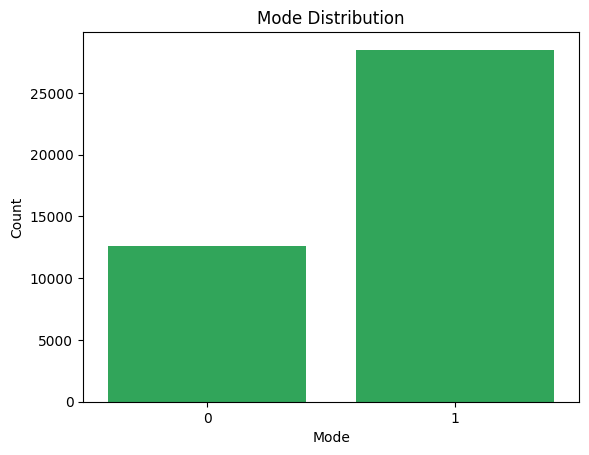

In [76]:
#plot for mode 
sns.countplot(df,x="mode",color="#1DB954")
plt.title("Mode Distribution")
plt.xlabel("Mode")
plt.ylabel("Count")
plt.show()

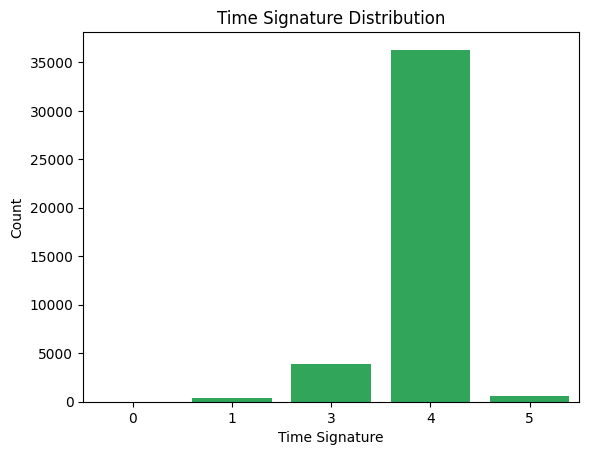

In [77]:
# Plot for Time Signature
sns.countplot(df,x="time_signature",color="#1DB954")
plt.title("Time Signature Distribution")
plt.xlabel("Time Signature")
plt.ylabel("Count")
plt.show()

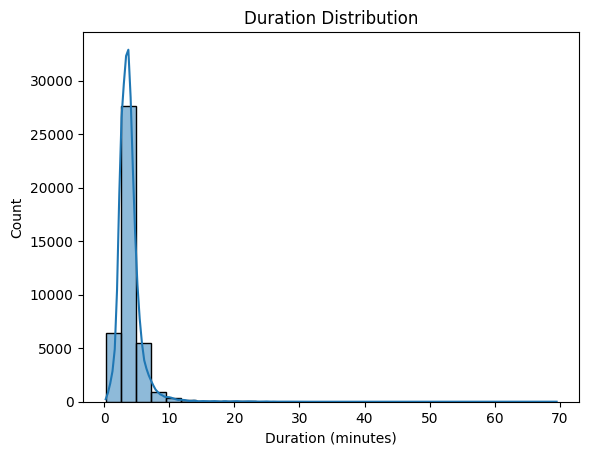

In [78]:
# Convert duration from ms to minutes
df['duration_min'] = df['duration_ms'] / 60000

sns.histplot(df, x="duration_min", bins=30, kde=True)
plt.title("Duration Distribution")
plt.xlabel("Duration (minutes)")
plt.ylabel("Count")
plt.show()

#### Insights from the above graph.
* Most of the song durations is below 10 minutes.
* There are very few songs which have duration above 10 minutes.
* There are some songs which have duration of above 80 minutes but are very less in number.

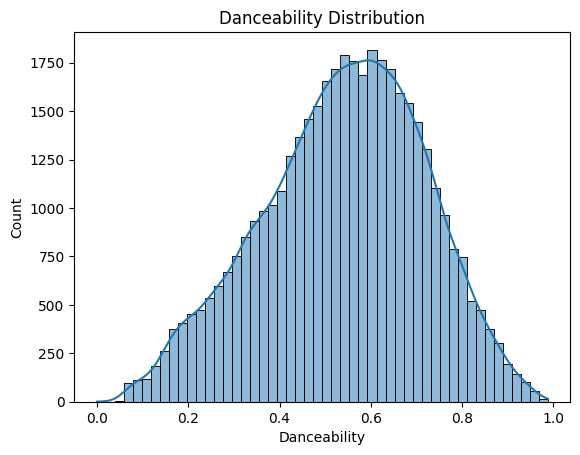

In [79]:
sns.histplot(df,x="danceability",bins=50,kde=True)
plt.title("Danceability Distribution")
plt.xlabel("Danceability")
plt.show()


#### Insights from above graph
* Most of the songs can be used for dancing.
* Most of the songs are having danceability above 5.

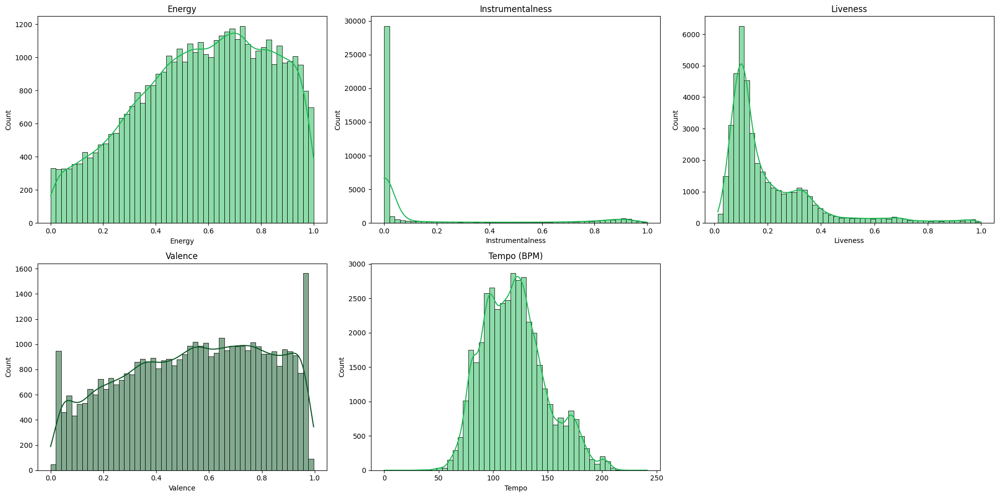

In [80]:

fig, axes = plt.subplots(2, 3, figsize=(20, 10))

# Energy
sns.histplot(df, x="energy", bins=50, kde=True, color="#1DB954", ax=axes[0, 0])
axes[0, 0].set_title("Energy")
axes[0, 0].set_xlabel("Energy")
axes[0, 0].set_ylabel("Count")

# Instrumentalness
sns.histplot(df, x="instrumentalness", bins=50, kde=True, color="#1DB954", ax=axes[0, 1])
axes[0, 1].set_title("Instrumentalness")
axes[0, 1].set_xlabel("Instrumentalness")
axes[0, 1].set_ylabel("Count")

# Liveness
sns.histplot(df, x="liveness", bins=50, kde=True, color="#1DB954", ax=axes[0, 2])
axes[0, 2].set_title("Liveness")
axes[0, 2].set_xlabel("Liveness")
axes[0, 2].set_ylabel("Count")

# Valence
sns.histplot(df, x="valence", bins=50, kde=True, color="#085623", ax=axes[1, 0])
axes[1, 0].set_title("Valence")
axes[1, 0].set_xlabel("Valence")
axes[1, 0].set_ylabel("Count")

# Tempo
sns.histplot(df, x="tempo", bins=50, kde=True, color="#1DB954", ax=axes[1, 1])
axes[1, 1].set_title("Tempo (BPM)")
axes[1, 1].set_xlabel("Tempo")
axes[1, 1].set_ylabel("Count")

# Hide the last (empty) subplot
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

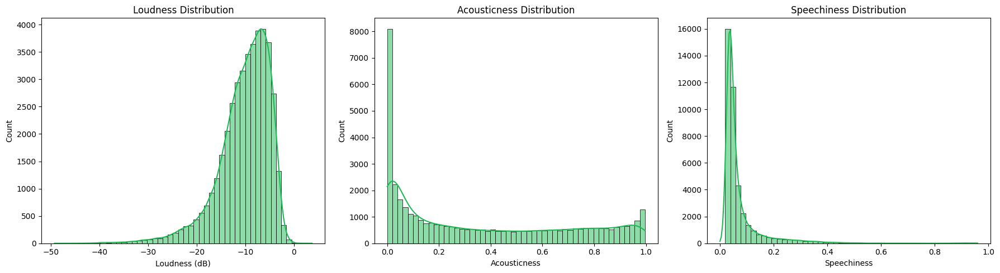

In [81]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Loudness Distribution
sns.histplot(df, x="loudness", bins=50, kde=True, color="#1DB954", ax=axes[0])
axes[0].set_title("Loudness Distribution")
axes[0].set_xlabel("Loudness (dB)")
axes[0].set_ylabel("Count")

# Acousticness Distribution
sns.histplot(df, x="acousticness", bins=50, kde=True, color="#1DB954", ax=axes[1])
axes[1].set_title("Acousticness Distribution")
axes[1].set_xlabel("Acousticness")
axes[1].set_ylabel("Count")

# Speechiness Distribution
sns.histplot(df, x="speechiness", bins=50, kde=True, color="#1DB954", ax=axes[2])
axes[2].set_title("Speechiness Distribution")
axes[2].set_xlabel("Speechiness")
axes[2].set_ylabel("Count")

plt.tight_layout()
plt.show()

Insights for the three features based on their histograms:

---

### **Loudness Distribution**
- **Most tracks have loudness between -30 dB and 0 dB.**
- The distribution is left-skewed, with a peak around -5 to -10 dB.
- Very few tracks are extremely quiet (below -30 dB).
- **Interpretation:** Most songs are produced at similar loudness levels, typical for commercial music.

---

### **Acousticness Distribution**
- The distribution is **bimodal**: many tracks have very low acousticness (close to 0), and a significant number have high acousticness (close to 1).
- Few tracks have intermediate acousticness values.
- **Interpretation:** The dataset contains both highly electronic (low acousticness) and highly acoustic tracks, with fewer tracks blending both.

---

### **Speechiness Distribution**
- Most tracks have low speechiness (close to 0), indicating little or no spoken words.
- There is a small bump at higher values, representing tracks with more speech-like content (e.g., rap, spoken word).
- **Interpretation:** Most songs are primarily musical, but there is a subset with significant spoken content.

---
.

## Bivariate Analysis

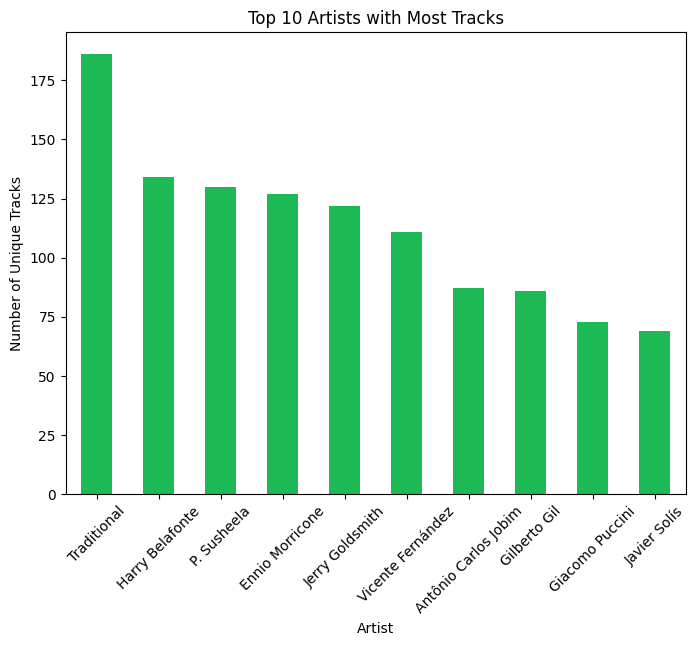

In [82]:
# unique albums per artist
artist_album_counts = df.groupby('artist')['track'].nunique().sort_values(ascending=False)

# Plot for top 10 artists with most albums
plt.figure(figsize=(8,6))
artist_album_counts.head(10).plot(kind='bar', color="#1DB954")
plt.title("Top 10 Artists with Most Tracks")
plt.xlabel("Artist")
plt.ylabel("Number of Unique Tracks")
plt.xticks(rotation=45)
plt.show()

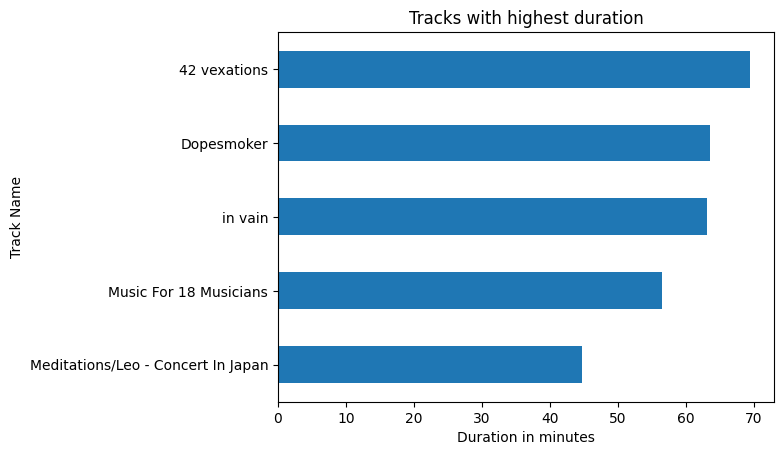

In [83]:
#Tracks with maximum duration
tracks_with_max_duration=df.groupby("track")["duration_min"].max().sort_values(ascending=False)[:5]
tracks_with_max_duration.plot(kind="barh")
plt.gca().invert_yaxis()
plt.title("Tracks with highest duration")
plt.ylabel("Track Name")
plt.xlabel("Duration in minutes")
plt.show()

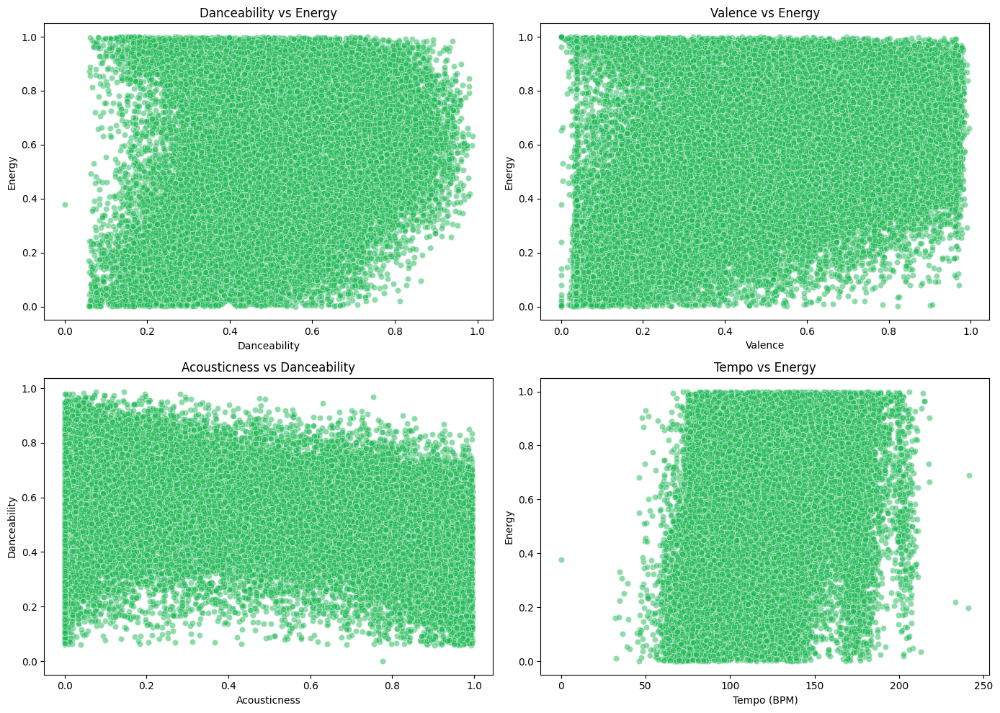

In [84]:
# Scatter plots for important feature relationships

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Danceability vs Energy
sns.scatterplot(data=df, x="danceability", y="energy", alpha=0.5, color="#1DB954", ax=axes[0, 0])
axes[0, 0].set_title("Danceability vs Energy")
axes[0, 0].set_xlabel("Danceability")
axes[0, 0].set_ylabel("Energy")

# Valence vs Energy
sns.scatterplot(data=df, x="valence", y="energy", alpha=0.5, color="#1DB954", ax=axes[0, 1])
axes[0, 1].set_title("Valence vs Energy")
axes[0, 1].set_xlabel("Valence")
axes[0, 1].set_ylabel("Energy")

# Acousticness vs Danceability
sns.scatterplot(data=df, x="acousticness", y="danceability", alpha=0.5, color="#1DB954", ax=axes[1, 0])
axes[1, 0].set_title("Acousticness vs Danceability")
axes[1, 0].set_xlabel("Acousticness")
axes[1, 0].set_ylabel("Danceability")

# Tempo vs Energy
sns.scatterplot(data=df, x="tempo", y="energy", alpha=0.5, color="#1DB954", ax=axes[1, 1])
axes[1, 1].set_title("Tempo vs Energy")
axes[1, 1].set_xlabel("Tempo (BPM)")
axes[1, 1].set_ylabel("Energy")

plt.tight_layout()
plt.show()

## Multivariate Analysis

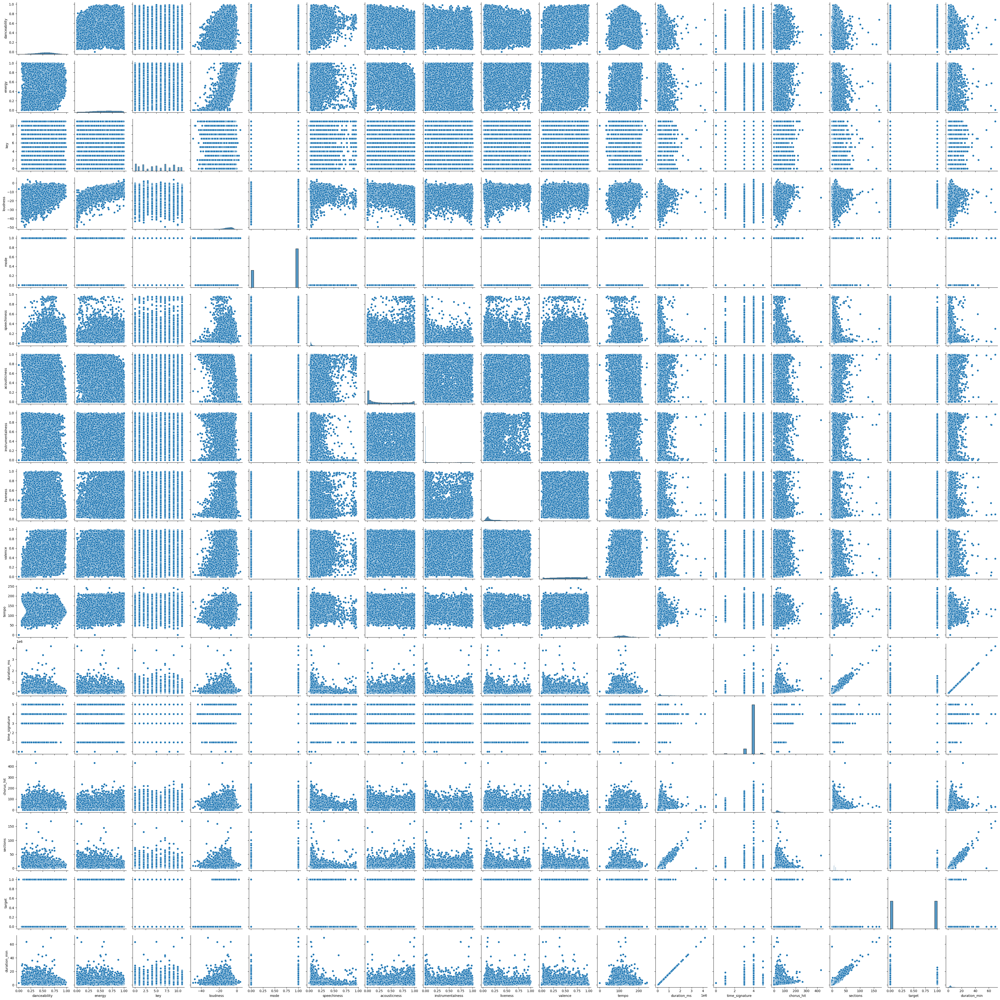

In [85]:
sns.pairplot(df)

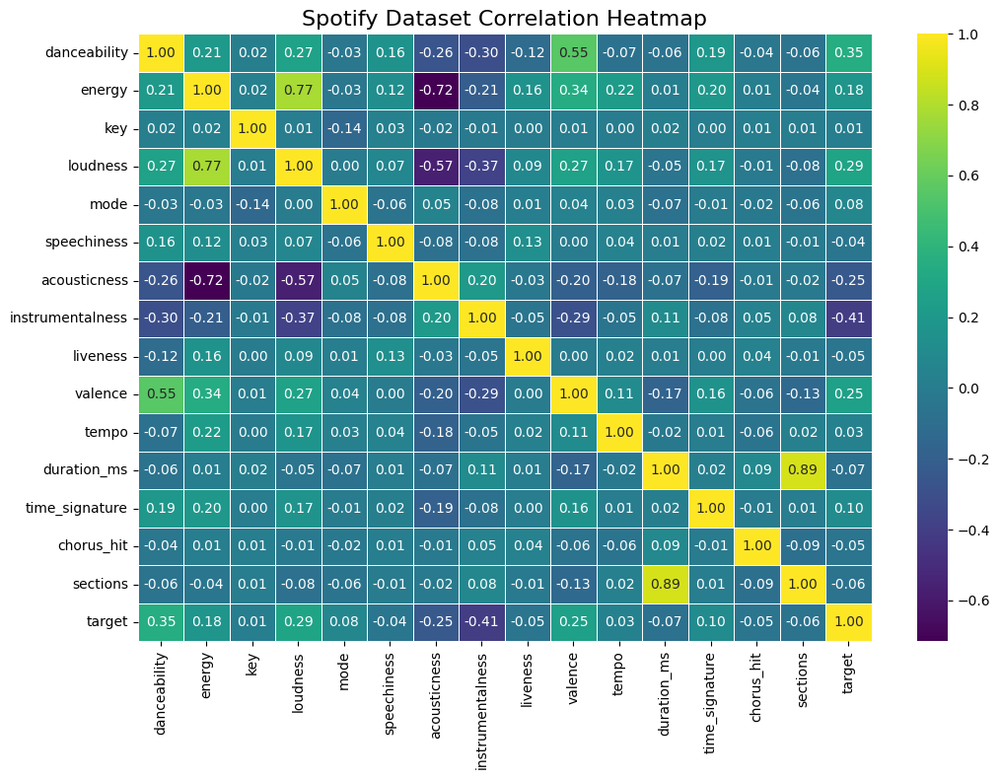

In [86]:
# Compute correlation
df.drop("duration_min",axis=1,inplace=True)
corr = df.corr(numeric_only=True)

# Plot correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, cmap='viridis', fmt=".2f", linewidths=0.5)
plt.title("Spotify Dataset Correlation Heatmap", fontsize=16)
plt.show()

## Data Preparation

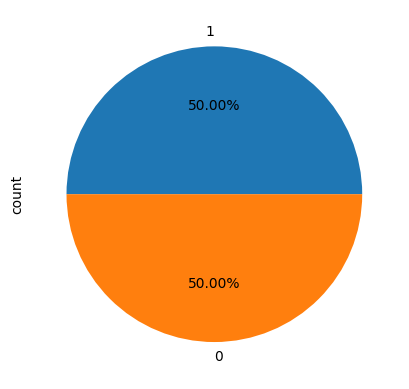

In [87]:
df["target"].value_counts().plot(kind="pie",autopct="%.2f%%")
plt.show()

#### This dataset is an balanced dataset.

In [88]:
df['tempo_bin'] = pd.cut(df['tempo'], bins=[0,80,120,160,200], labels=['slow','medium','fast','very fast'])


In [89]:
import numpy as np


df['loudness_log'] = np.log1p(df['loudness'].clip(lower=0))
df['duration_ms_log'] = np.log1p(df['duration_ms'])


In [90]:
df['chorus_hit_log'] = np.log1p(df['chorus_hit'])

In [91]:
# Numerical features
numerical_features = [
    "danceability", "energy", "speechiness", 
    "acousticness", "instrumentalness", "liveness", 
    "valence", "sections","loudness_log","duration_ms_log","chorus_hit_log"
]

# Categorical features
categorical_features = [
    "key", "mode", "time_signature","tempo_bin"
]

# Columns to drop (non-useful for ML modeling)
columns_to_drop = ["track", "artist", "uri", "chorus_hit", "loudness","duration_ms","tempo"]


In [92]:
#Dropping the unnecessary columns
df.drop(columns=columns_to_drop,axis=1,inplace=True)

In [93]:
#splitting the data into train and test
X,y=df.drop('target',axis=1),df["target"]
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.25,shuffle=True,stratify=y)

In [94]:
# Numeric pipeline
numeric_transformer = Pipeline(steps=[
    ("scaler", StandardScaler())
])

# Categorical pipeline
categorical_transformer = Pipeline(steps=[
    ("encoder", OneHotEncoder(handle_unknown="ignore"))
])

preprocessor=ColumnTransformer(transformers=[
     ("num", numeric_transformer, numerical_features),
     ("cat", categorical_transformer, categorical_features)
],remainder="passthrough")


In [95]:
# To train models which donot require scaling
preprocessor_cat=ColumnTransformer(transformers=[
     ("cat", categorical_transformer, categorical_features)
],remainder="passthrough")

In [96]:
#Transform the train and test data
processed_train_data=preprocessor.fit_transform(X_train)
processed_test_data=preprocessor.transform(X_test)

In [97]:
processed_train_data_cat=preprocessor_cat.fit_transform(X_train)
processed_test_data_cat=preprocessor_cat.transform(X_test)

## MODEL TRAINING

In [98]:
# # Preparing Baseline models
models={
    "RandomForest":RandomForestClassifier(n_jobs=-1),
    "LogisticRegression":LogisticRegression(),
    "SGDClassifier":SGDClassifier(),
    "BernouliNB":BernoulliNB(),
    "KNN":KNeighborsClassifier(),
    "DecisionTreeClassifier":DecisionTreeClassifier(),
    "XGBClassifier":XGBClassifier(),
    "GradientBoostingClassifier":GradientBoostingClassifier(),
    "AdaBoostClassifier":AdaBoostClassifier(),
    "MLPClassifier":MLPClassifier()
}

Model: RandomForest
Accuracy Score   : 0.7860
Precision Score  : 0.7612
Recall Score     : 0.8336
F1 Score         : 0.7958
ROC AUC Score    : 0.7860


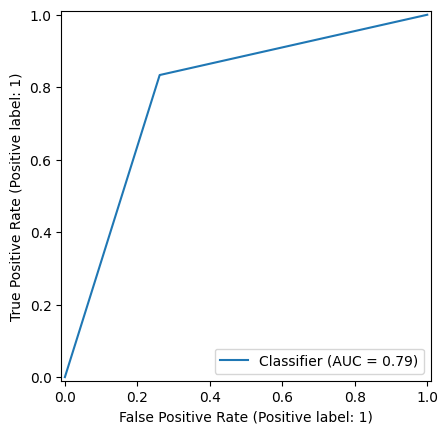

Model: LogisticRegression
Accuracy Score   : 0.7221
Precision Score  : 0.6888
Recall Score     : 0.8105
F1 Score         : 0.7447
ROC AUC Score    : 0.7221


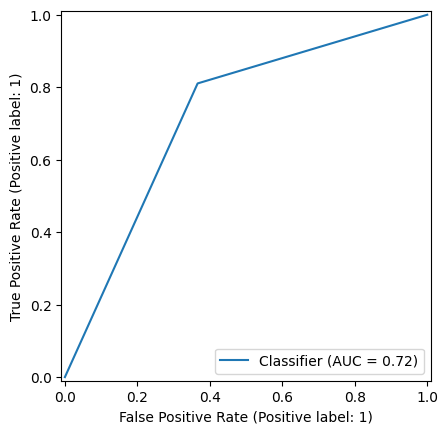

Model: SGDClassifier
Accuracy Score   : 0.7178
Precision Score  : 0.6831
Recall Score     : 0.8128
F1 Score         : 0.7423
ROC AUC Score    : 0.7178


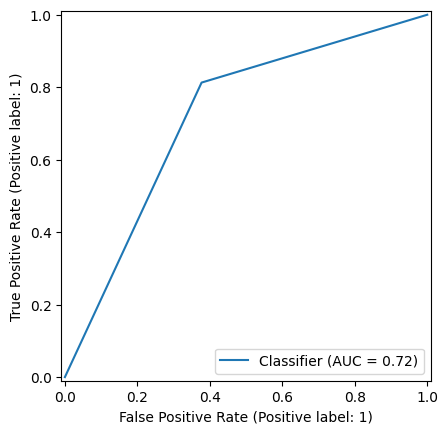

Model: BernouliNB
Accuracy Score   : 0.6096
Precision Score  : 0.5926
Recall Score     : 0.7015
F1 Score         : 0.6425
ROC AUC Score    : 0.6096


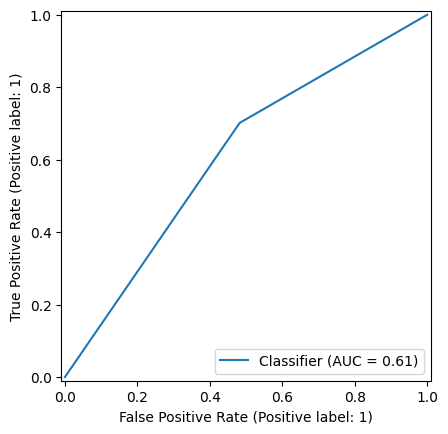

Model: KNN
Accuracy Score   : 0.7213
Precision Score  : 0.6877
Recall Score     : 0.8111
F1 Score         : 0.7443
ROC AUC Score    : 0.7213


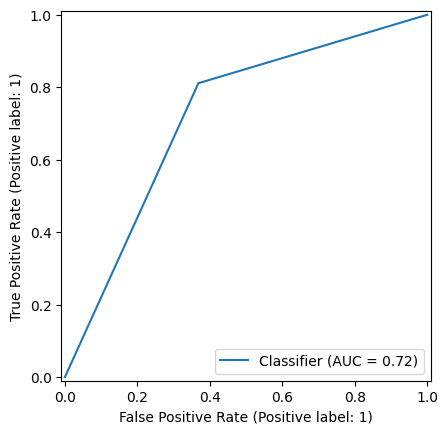

Model: DecisionTreeClassifier
Accuracy Score   : 0.6968
Precision Score  : 0.6999
Recall Score     : 0.6892
F1 Score         : 0.6945
ROC AUC Score    : 0.6968


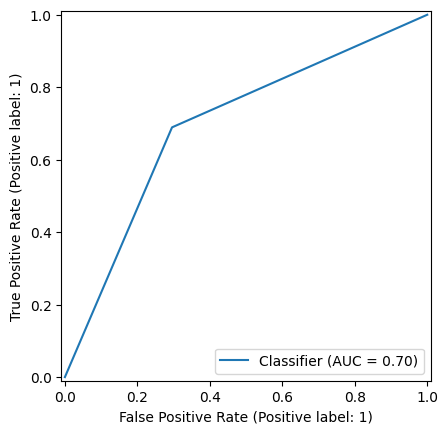

Model: XGBClassifier
Accuracy Score   : 0.7838
Precision Score  : 0.7566
Recall Score     : 0.8367
F1 Score         : 0.7947
ROC AUC Score    : 0.7838


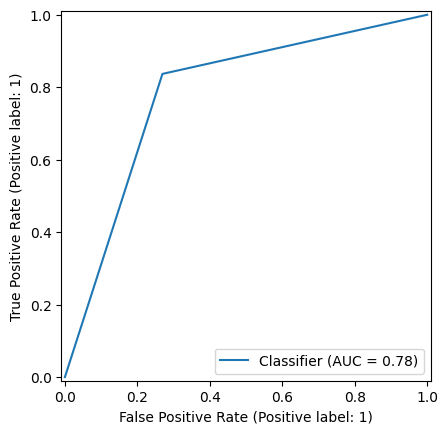

Model: GradientBoostingClassifier
Accuracy Score   : 0.7753
Precision Score  : 0.7427
Recall Score     : 0.8426
F1 Score         : 0.7895
ROC AUC Score    : 0.7753


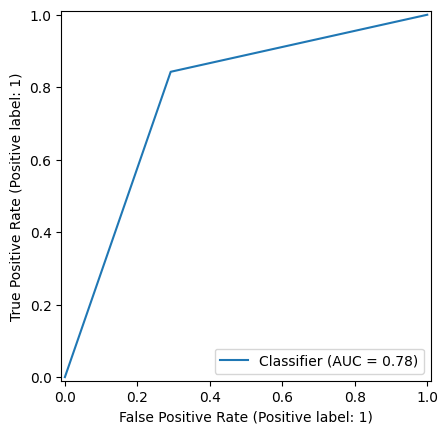

Model: AdaBoostClassifier
Accuracy Score   : 0.7350
Precision Score  : 0.7126
Recall Score     : 0.7879
F1 Score         : 0.7484
ROC AUC Score    : 0.7350


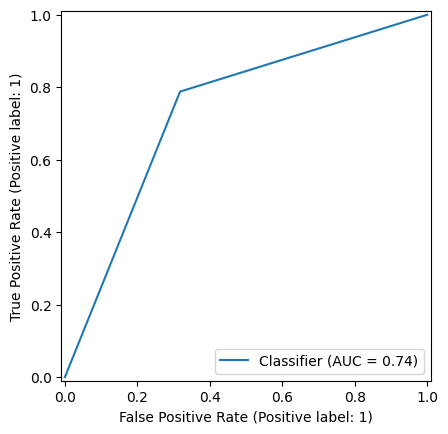

Model: MLPClassifier
Accuracy Score   : 0.7693
Precision Score  : 0.7404
Recall Score     : 0.8293
F1 Score         : 0.7824
ROC AUC Score    : 0.7693


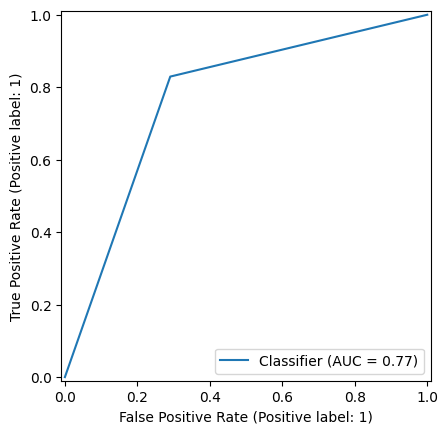

In [99]:
results={}
for model_name, model in models.items():
    # Decide which version of X to use
    if model_name in ["LogisticRegression", "SGDClassifier", "KNN","MLPClassifier"]:
        Xtr, Xte = processed_train_data,processed_test_data
        y_train=y_train
    else:
        Xtr, Xte = processed_train_data_cat,processed_test_data_cat
        y_train=y_train
    
    # Train & evaluate
    model.fit(Xtr, y_train)                                                      
    y_preds = model.predict(Xte)

    results[model_name] = {
        "Accuracy_score": accuracy_score(y_test, y_preds),
        "Precision_score": precision_score(y_test, y_preds),
        "Recall_score": recall_score(y_test, y_preds),
        "f1_score": f1_score(y_test, y_preds),
        "roc_auc_score": roc_auc_score(y_test, y_preds)
    }

    print(f"Model: {model_name}")
    print(f"Accuracy Score   : {accuracy_score(y_test, y_preds):.4f}")
    print(f"Precision Score  : {precision_score(y_test, y_preds):.4f}")
    print(f"Recall Score     : {recall_score(y_test, y_preds):.4f}")
    print(f"F1 Score         : {f1_score(y_test, y_preds):.4f}")
    print(f"ROC AUC Score    : {roc_auc_score(y_test, y_preds):.4f}")

    # print(classification_report(y_test, y_preds))
    RocCurveDisplay.from_predictions(y_test, y_preds)
    plt.show()
    print("=="*50)


In [100]:
result_df = pd.DataFrame(results).T
result_df.sort_values(by="Accuracy_score", ascending=False, inplace=True)

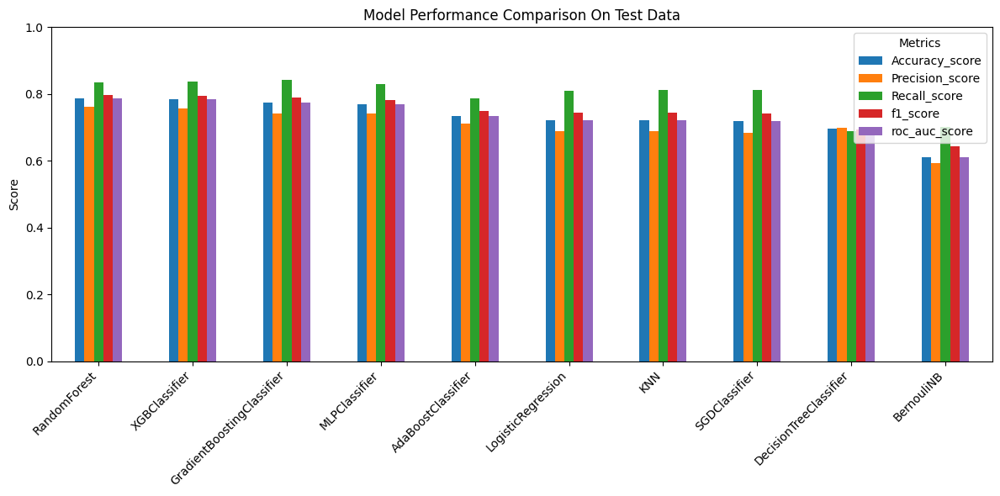

In [101]:

result_df.plot(kind="bar", figsize=(12, 6))
plt.title("Model Performance Comparison On Test Data")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.xticks(rotation=45, ha="right")
plt.legend(title="Metrics",loc="upper right")
plt.tight_layout()
plt.show() 

#### From the above graph we will take the top models for hyperparameter tunning.

## Hyperparameter Tunning

### We will tune:
* RandomForestClassifier
* MLPClassifer
* XGBoost
* SGDClassifier

### RandomForestClassifier

In [55]:
# # Tunning the RandomForestclassifier
cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
param_dist_rf = {
    "n_estimators": [100, 200, 300, 500, 1000],        
    "max_depth": [None, 5, 10, 20, 30, 50],            
    "min_samples_split": [2, 5, 10, 20],               
    "min_samples_leaf": [1, 2, 4, 8],                 
    "max_features": ["sqrt", "log2", None],            
    "bootstrap": [True, False],                        
    "criterion": ["gini", "entropy"],                  

}


rnd_rf=RandomizedSearchCV(RandomForestClassifier(),
                          param_distributions=param_dist_rf,
                          cv=cv_strategy,
                          n_iter=20,
                          verbose=2,
                          n_jobs=-1,
                          scoring="accuracy")
rnd_rf.fit(processed_train_data_cat, y_train)


Fitting 5 folds for each of 20 candidates, totalling 100 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=RandomForestClassifier(), n_iter=20, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'criterion': ['gini', 'entropy'],
                                        'max_depth': [None, 5, 10, 20, 30, 50],
                                        'max_features': ['sqrt', 'log2', None],
                                        'min_samples_leaf': [1, 2, 4, 8],
                                        'min_samples_split': [2, 5, 10, 20],
                                        'n_estimators': [100, 200, 300, 500,
                                                         1000]},
                   scoring='accuracy', verbose=2)

### SGDClassifier

In [57]:
param_grid_sgd = {
    "loss": ["hinge", "log_loss"],  
    "alpha": [1e-4, 1e-3, 1e-2],   
    "penalty": ["l2", "elasticnet"]
}
rnd_sgd=RandomizedSearchCV(SGDClassifier(),
                          param_distributions=param_grid_sgd,
                          cv=cv_strategy,n_iter=20,
                          verbose=2,
                          n_jobs=-1,
                          scoring="accuracy")

rnd_sgd.fit(processed_train_data, y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=SGDClassifier(), n_iter=20, n_jobs=-1,
                   param_distributions={'alpha': [0.0001, 0.001, 0.01],
                                        'loss': ['hinge', 'log_loss'],
                                        'penalty': ['l2', 'elasticnet']},
                   scoring='accuracy', verbose=2)

### XGBoost

In [60]:
param_dist_xgb = {
    "n_estimators": [100, 300],
    "max_depth": [3, 6],
    "learning_rate": [0.05, 0.1],
    "subsample": [0.8, 1.0],
    "colsample_bytree": [0.8, 1.0],
    "min_child_weight": [1, 5],
    "gamma": [0, 0.2],
    "reg_alpha": [0, 0.1],
    "reg_lambda": [1, 5]
}

rnd_xgb=RandomizedSearchCV(XGBClassifier(),
                          param_distributions=param_dist_xgb,
                          cv=cv_strategy,n_iter=20,
                          verbose=2,
                          n_jobs=-1,
                          scoring="accuracy")

rnd_xgb.fit(processed_train_data_cat, y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           feature_weights=None, gamma=None,
                                           grow...
                                           multi_strategy=None,
                                           n_estimators=None, n_jobs=None,
                                           num_parallel_tree=None, ...),
                   n_iter=20, n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.8, 1.0],
                                        'gamma': [0, 0.2],
                                        'learning_rate': [0.05, 0.1],
                                        'max_depth': [3, 6],
                                        'min_child_weight': [1, 5],
                                        'n_estimators': [100, 300],
                                        'reg_alpha': [0, 0.1],
                                        'reg_lambda': [1, 5],
                                        'subsample': [0.8, 1.0]},
                   scoring='accuracy', verbose=2)

### MLPClassifier

In [62]:
param_dist_mlp = {
    "hidden_layer_sizes": [(50,), (100,), (100, 50)],
    "activation": ["tanh", "relu"],
    "solver": ["adam", "sgd"],
    "alpha": [1e-5, 1e-4, 1e-2],        
    "learning_rate": ["constant", "adaptive"],
    "batch_size": [16, 32, 64],
}
rnd_mlp=RandomizedSearchCV(MLPClassifier(),
                          param_distributions=param_dist_mlp,
                          cv=cv_strategy,n_iter=20,
                          verbose=2,
                          n_jobs=-1,
                          scoring="accuracy")

rnd_mlp.fit(processed_train_data, y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=MLPClassifier(), n_iter=20, n_jobs=-1,
                   param_distributions={'activation': ['tanh', 'relu'],
                                        'alpha': [1e-05, 0.0001, 0.01],
                                        'batch_size': [16, 32, 64],
                                        'hidden_layer_sizes': [(50,), (100,),
                                                               (100, 50)],
                                        'learning_rate': ['constant',
                                                          'adaptive'],
                                        'solver': ['adam', 'sgd']},
                   scoring='accuracy', verbose=2)

In [63]:

models = {
    "XGBoost": rnd_xgb,
    "SGDClassifier": rnd_sgd,
    "MLPClassifier": rnd_mlp,
    "RandomForest": rnd_rf
}


results = []
for name, search in models.items():
    results.append({
        "Model": name,
        "Best Score (CV)": search.best_score_,
        "Best Params": search.best_params_
    })


df_results_tunned = pd.DataFrame(results).sort_values(by="Best Score (CV)", ascending=False)
print(df_results_tunned)


           Model  Best Score (CV)  \
3   RandomForest         0.787051   
0        XGBoost         0.783710   
2  MLPClassifier         0.778261   
1  SGDClassifier         0.724124   

                                         Best Params  
3  {'n_estimators': 1000, 'min_samples_split': 2,...  
0  {'subsample': 0.8, 'reg_lambda': 1, 'reg_alpha...  
2  {'solver': 'sgd', 'learning_rate': 'adaptive',...  
1  {'penalty': 'l2', 'loss': 'log_loss', 'alpha':...  


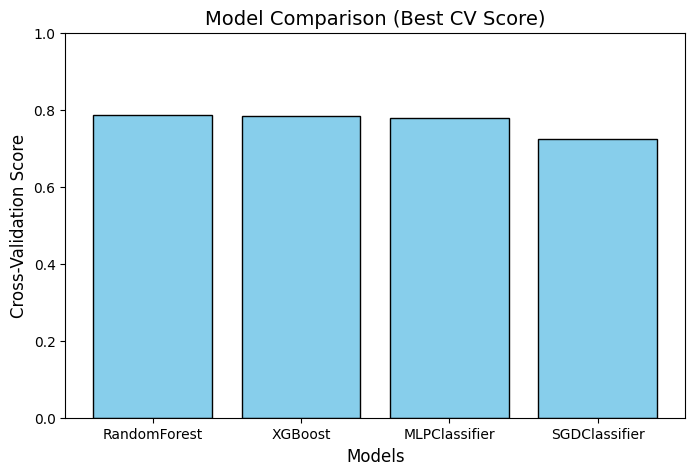

In [64]:

# Bar plot
plt.figure(figsize=(8,5))
plt.bar(df_results_tunned["Model"], df_results_tunned["Best Score (CV)"], color="skyblue", edgecolor="black")
plt.title("Model Comparison (Best CV Score)", fontsize=14)
plt.ylabel("Cross-Validation Score", fontsize=12)
plt.xlabel("Models", fontsize=12)
plt.ylim(0, 1)  
plt.show()

#### The scores did not improve much.

## Feature Importances

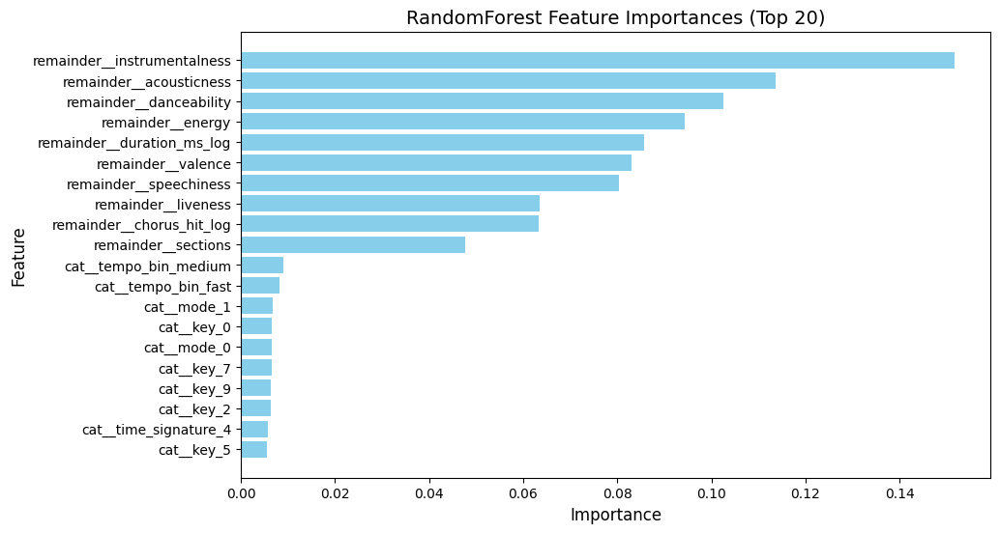

In [66]:
# Best RF model after tuning
best_rf = rnd_rf.best_estimator_

# Feature importances
importances = best_rf.feature_importances_

feature_names = preprocessor_cat.get_feature_names_out()


importance_df = pd.DataFrame({
    "Feature": feature_names,
    "Importance": importances
}).sort_values(by="Importance", ascending=False)

# Top 20 features
top_n = 20
plt.figure(figsize=(10,6))
plt.barh(importance_df["Feature"][:top_n][::-1], importance_df["Importance"][:top_n][::-1], color="skyblue")
plt.title("RandomForest Feature Importances (Top 20)", fontsize=14)
plt.xlabel("Importance", fontsize=12)
plt.ylabel("Feature", fontsize=12)
plt.show()

---
## Thank You 🙏
Thanks for reading my notebook!  
If you found it useful, please consider **upvoting** ❤️
